In [1]:
# Importing required libraries 

import pandas as pd
import tkinter as tk
from tkinter import filedialog
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

# Necessary utility modules and libraries
import os
import shutil
import pathlib
import random
import datetime
import cv2


# Plotting libraries 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import gaussian, convolve2d
import seaborn as sns

import os
import matplotlib.image as mpimg
import cv2
import matplotlib.pyplot as plt
from tkinter import filedialog
import tkinter as tk


# Libraries for building the model
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Conv2D, Flatten, MaxPool2D, Dropout, Activation, GlobalAveragePooling2D, BatchNormalization, GlobalMaxPooling2D
from tensorflow.keras.applications import DenseNet121, ResNet50, InceptionV3, Xception, VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras import backend
from tensorflow.keras.regularizers import l2, l1
from sklearn.metrics import classification_report, precision_recall_fscore_support, accuracy_score, confusion_matrix
from sklearn.model_selection import GridSearchCV

import os
import numpy as np
from PIL import Image
from tkinter import Tk, filedialog

print('Libraries are loaded')

Libraries are loaded


In [3]:
# Defining function Weiner filter - Image preprocessing

# wiener filter
def wiener_filter(img, kernel, K):
    kernel /= np.sum(kernel)
    dummy = np.copy(img)
    dummy = np.fft.fft2(dummy)
    kernel = np.fft.fft2(kernel, s = img.shape)
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
    dummy = dummy * kernel
    dummy = np.abs(np.fft.ifft2(dummy))
    return dummy

def gaussian_kernel(kernel_size = 3):
    h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
    h = np.dot(h, h.transpose())
    h /= np.sum(h)
    return h

def isbright(image, dim=227, thresh=0.4):
    # Resize image to 10x10
    image = cv2.resize(image, (dim, dim))
    # Convert color space to LAB format and extract L channel
    L, A, B = cv2.split(cv2.cvtColor(image, cv2.COLOR_BGR2LAB))
    # Normalize L channel by dividing all pixel values with maximum pixel value
    L = L/np.max(L)
    # Return True if mean is greater than thresh else False
    return np.mean(L) > thresh

In [4]:

def image_preprocessing(img):
    # Read the image
#     img = mpimg.imread(img_path)
    img = img.astype(np.uint8)
    
    # Extracting the green channel of the images
    b, g, r = cv2.split(img)
    
    # Applying CLAHE function for intensifying the green channel to extracted image
    clh = cv2.createCLAHE(clipLimit=4.0)
    g = clh.apply(g)
    
    # transform the images to grayscale
    merged_bgr_green_fused = cv2.merge((b, g, r))
    img_bw = cv2.cvtColor(merged_bgr_green_fused, cv2.COLOR_BGR2GRAY)
    
    # Removing isolated pixels by morphological clean function.
    kernel1 = np.ones((1, 1), np.uint8)
    morph_open = cv2.morphologyEx(img_bw, cv2.MORPH_OPEN, kernel1)
    
    # Extracting the blood vessels applying mean-C thresholds.
    thresh = cv2.adaptiveThreshold(morph_open, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 9, 5)
    
    # Use morph open operation
    kernel2 = np.ones((2, 2), np.uint8)
    morph_open2 = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel2)
    
    # Stack images to 3 channels
    stacked_img = np.stack((morph_open2,)*3, axis=-1)
    
    return stacked_img.astype("float64")

2023-06-28 15:15:36.872 python[28983:8751591] +[CATransaction synchronize] called within transaction
2023-06-28 15:15:43.347 python[28983:8751591] +[CATransaction synchronize] called within transaction
2023-06-28 15:15:57.988 python[28983:8751591] +[CATransaction synchronize] called within transaction
2023-06-28 15:16:13.722 python[28983:8751591] +[CATransaction synchronize] called within transaction
2023-06-28 15:16:29.637 python[28983:8751591] +[CATransaction synchronize] called within transaction
2023-06-28 15:16:31.560 python[28983:8751591] +[CATransaction synchronize] called within transaction
2023-06-28 15:16:48.465 python[28983:8751591] +[CATransaction synchronize] called within transaction
2023-06-28 15:30:29.839 python[28983:8751591] +[CATransaction synchronize] called within transaction
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


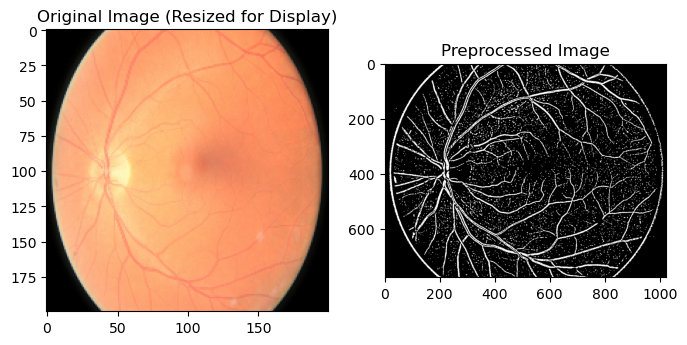

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


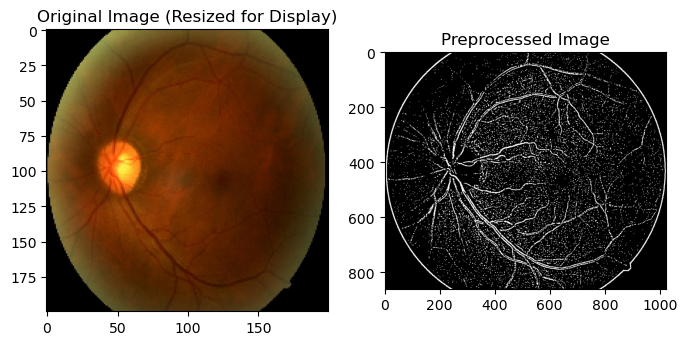

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


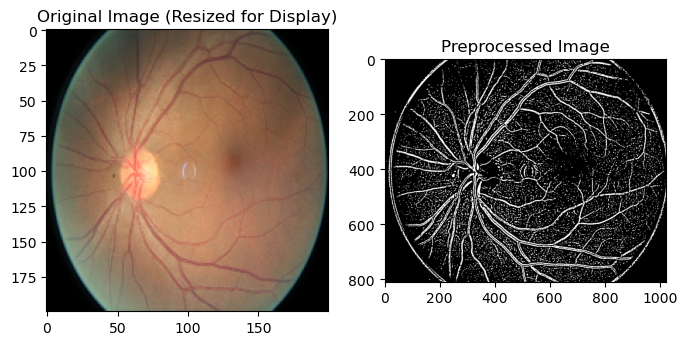

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


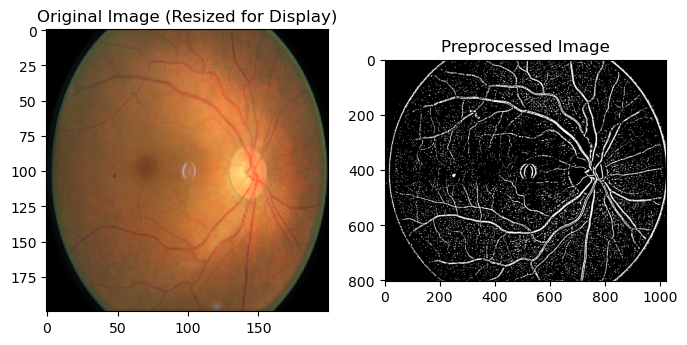

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


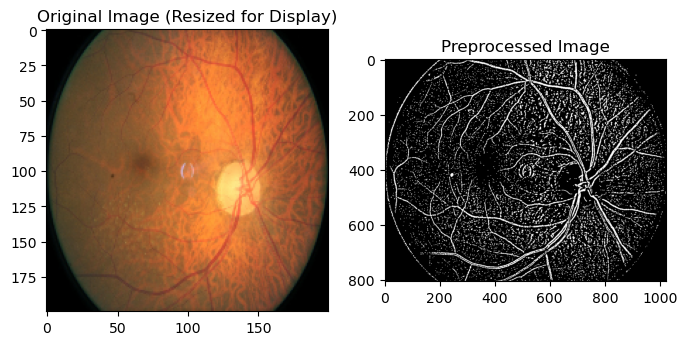

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


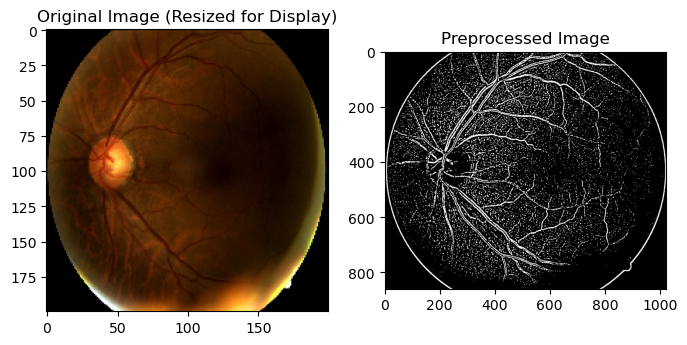

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


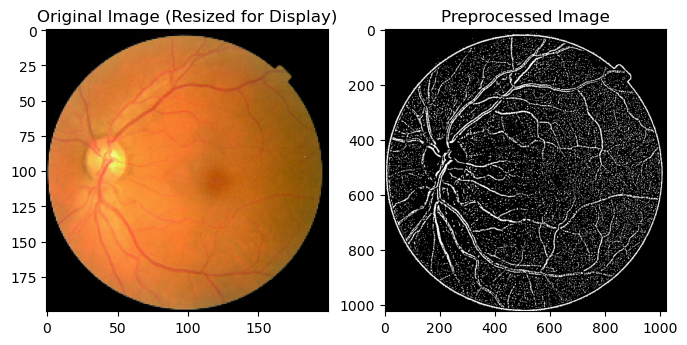

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


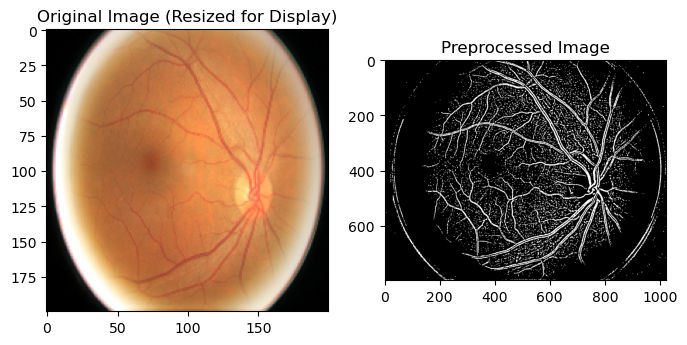

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


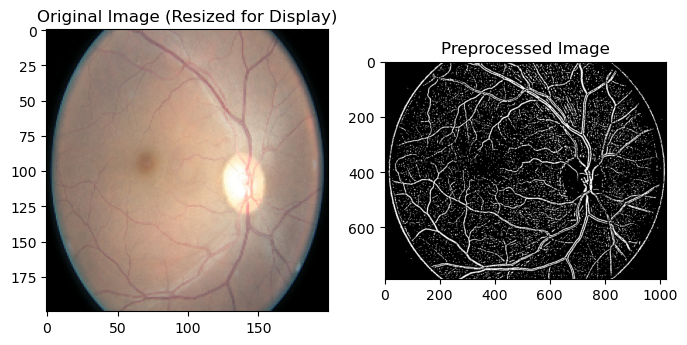

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


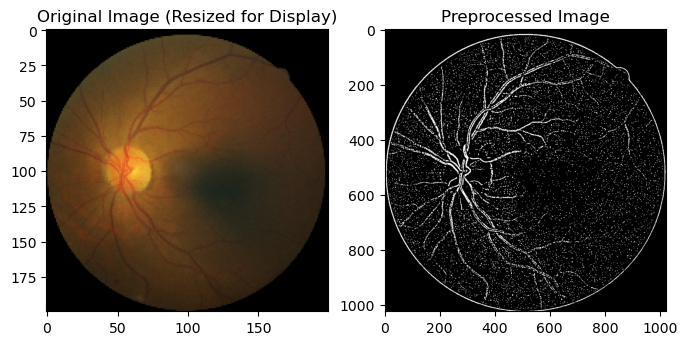

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


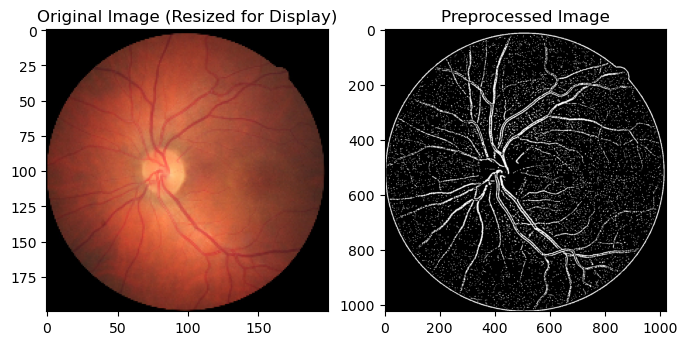

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


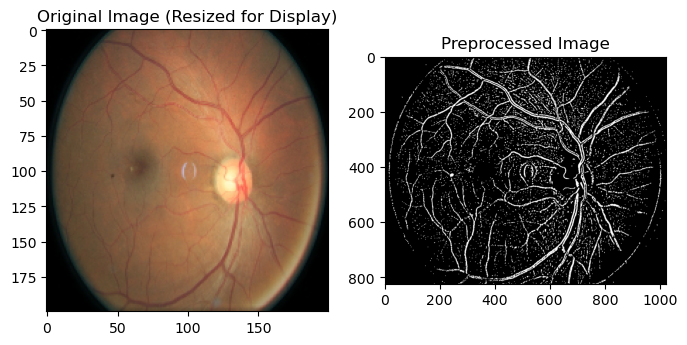

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


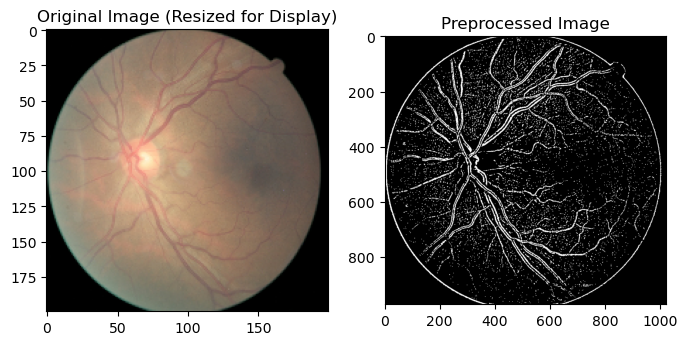

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


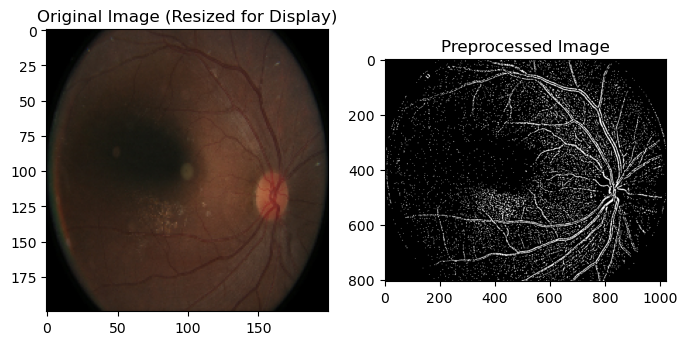

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


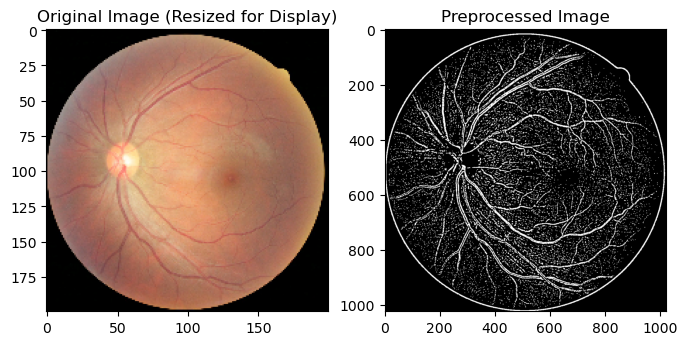

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


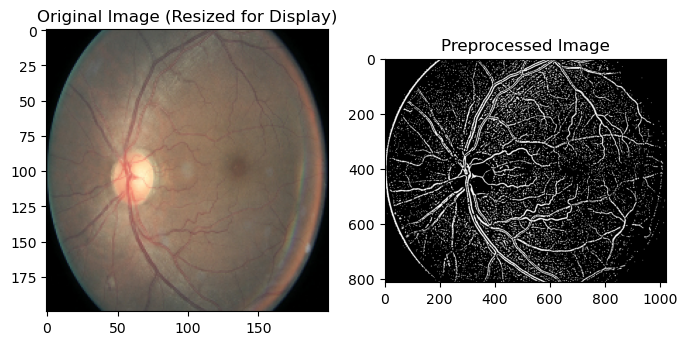

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


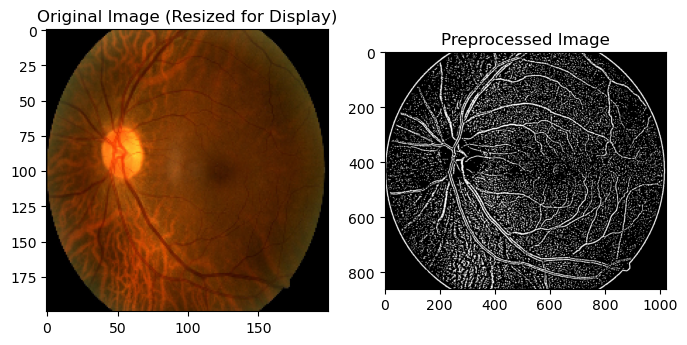

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


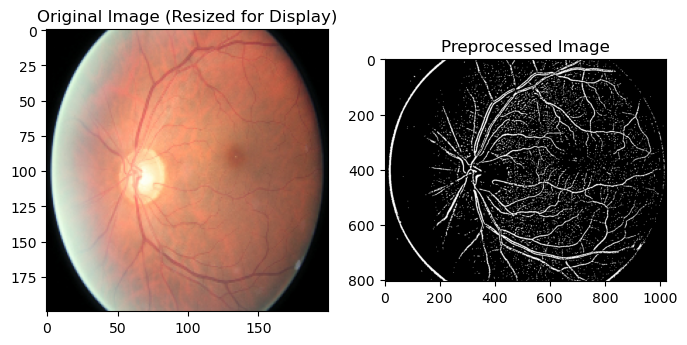

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


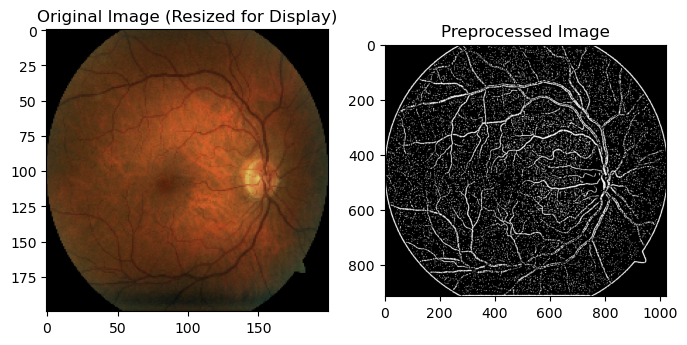

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


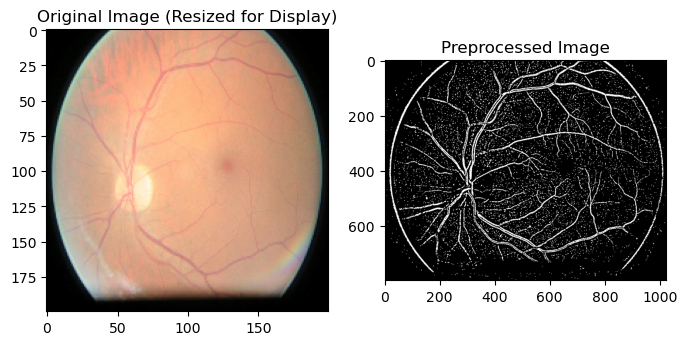

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


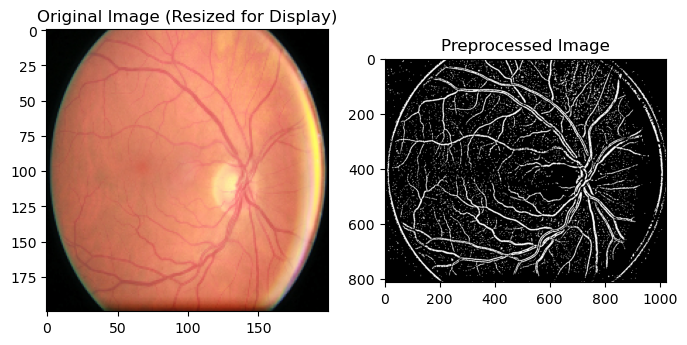

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


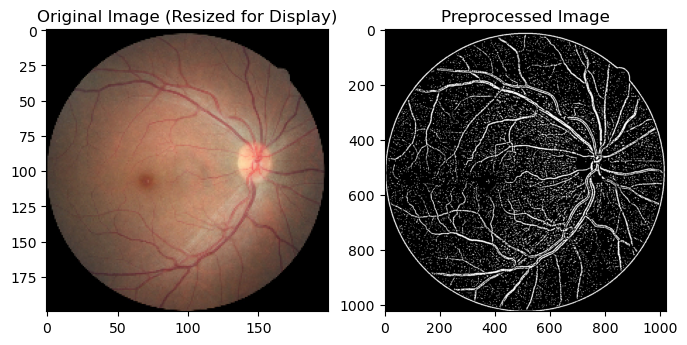

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


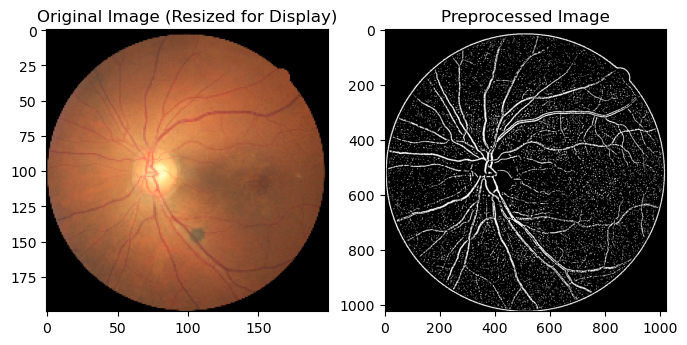

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


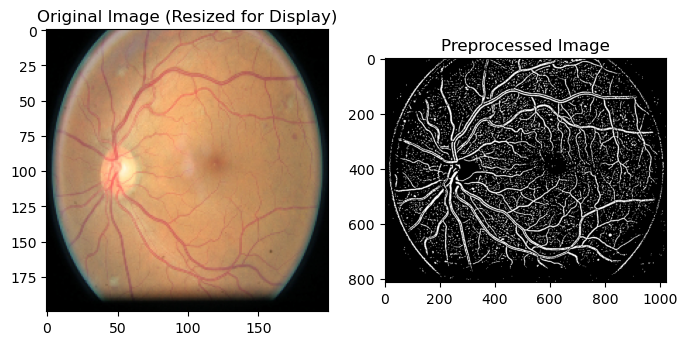

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


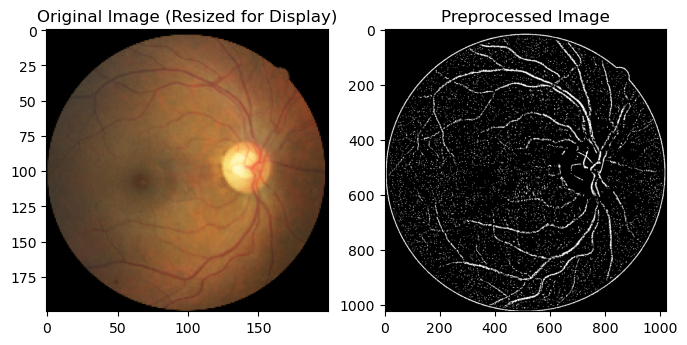

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


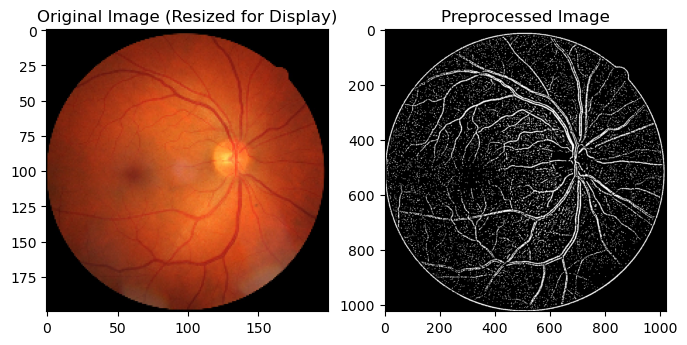

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


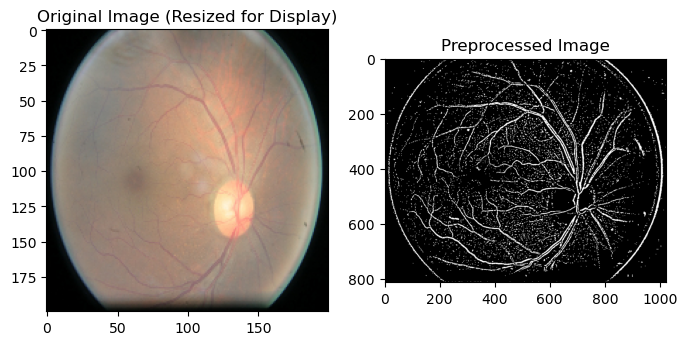

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


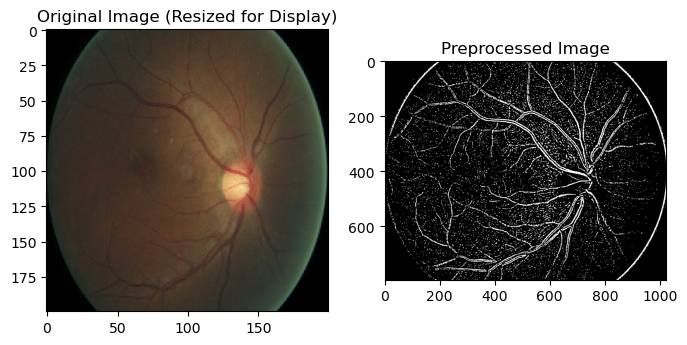

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


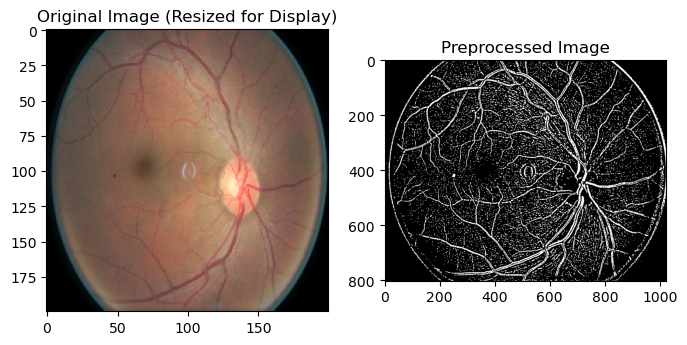

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


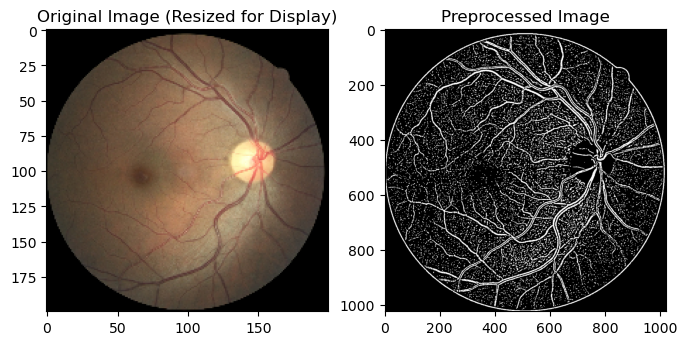

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


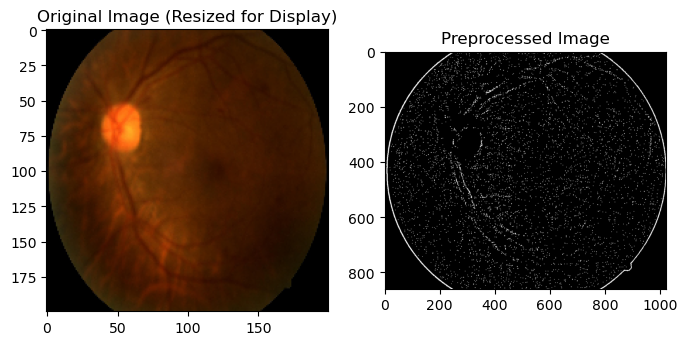

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


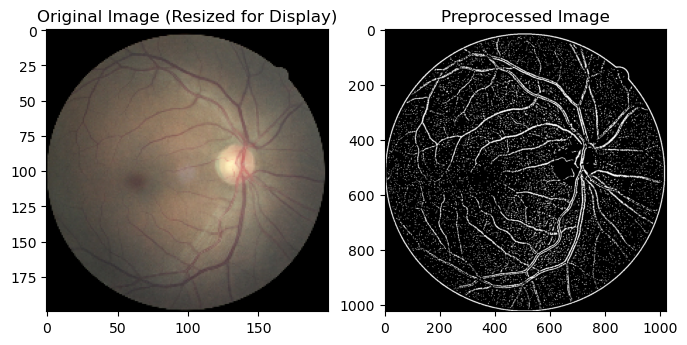

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [ ]:
# Loading images from the source path saving the preprocessed files to target path

# Create a Tkinter root window
root = tk.Tk()
root.withdraw()

# Prompt the user to select the directory containing the images
image_dir = filedialog.askdirectory(title="Select Directory Containing Images")

# Prompt the user to select the output directory for preprocessed images
output_dir = filedialog.askdirectory(title="Select Output Directory")

# Get a list of all image files in the directory
image_files = os.listdir(image_dir)

# Keep track of processed image count
processed_images = 0

# Define the desired display size of the images
display_size = (8, 8)  # Adjust as needed

# Define the desired display resolution
display_resolution = (200, 200)  # Adjust as needed

# Iterate over the image files and preprocess the first 10 images
for image_file in image_files:
    if processed_images >= 823:
        break

    # Check if the file is an image
    if image_file.endswith('.jpeg'):
        image_path = os.path.join(image_dir, image_file)

        # Read the original image
        img_original = mpimg.imread(image_path)

        # Preprocess the image
        img_preprocessed = image_preprocessing(img_original)

        # Create the output file path
        filename = os.path.basename(image_path)
        output_path = os.path.join(output_dir, filename)

        # Save the preprocessed image
        cv2.imwrite(output_path, img_preprocessed)

        processed_images += 1

        # Resize the original image for display
        img_display = cv2.resize(img_original, display_resolution)

        # Display the original and preprocessed images side by side
        fig, axs = plt.subplots(1, 2, figsize=display_size)
        axs[0].imshow(img_display)
        axs[0].set_title('Original Image (Resized for Display)')
        axs[1].imshow(img_preprocessed, cmap='gray')
        axs[1].set_title('Preprocessed Image')
        plt.show()
